<h3>Statistics 2<br><br> 2nd Project Assignment</h3>

<h4>Imports</h4>

In [1]:
import math
import pandas as pd
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly
import numpy as np
import scipy.stats as stats
import pylab 
import random
import plotly.figure_factory as ff

In [2]:
plotly.offline.init_notebook_mode()

In [3]:
adult_incomes = pd.read_csv("adult.csv").drop(["capital-gain", "capital-loss"],  axis=1).replace("?", "Other")
num_records = len(adult_incomes) 

<h3>1. Estimation</h3>

In [4]:
def mean_feature_by_binary_value(df, numeric_feature, binary_feature, value):
    """
    Return the mean of numeric feature where records satifies binary_feature equals to value
    df: pandas df
    numeric_feature: string, name of numeric feature
    binary_feature: string, name of binary feature
    value: string, value of binary feature
    """
    return df[df[binary_feature] == value][numeric_feature].mean()

def var_feature_by_binary_value(df, numeric_feature, binary_feature, value):
    """
    Return the variance of numeric feature where records satifies binary_feature equals to value
    df: pandas df
    numeric_feature: string, name of numeric feature
    binary_feature: string, name of binary feature
    value: string, value of binary feature
    """
    return df[df[binary_feature] == value][numeric_feature].var(ddof=0)

In [5]:
numeric_feature = "educational-num"
binary_feature = "gender"
binary_values = ["Male", "Female"]

mean_male, mean_female =\
    mean_feature_by_binary_value(adult_incomes, numeric_feature, binary_feature, binary_values[0]),\
    mean_feature_by_binary_value(adult_incomes, numeric_feature, binary_feature, binary_values[1])
    
mean_male, mean_female

(10.094977029096478, 10.044034090909092)

In [6]:
se_male, se_female =\
    var_feature_by_binary_value(adult_incomes, numeric_feature, binary_feature, binary_values[0]) ** 0.5,\
    var_feature_by_binary_value(adult_incomes, numeric_feature, binary_feature, binary_values[1]) ** 0.5

alpha = 0.05
z_quantile = stats.norm.ppf(1 - (alpha / 2))

male_confidence_interval = [mean_male - z_quantile * se_male, mean_male + z_quantile * se_male]
female_confidence_interval = [mean_female - z_quantile * se_male, mean_female + z_quantile * se_female]

print("Male mean of educational number of years confidence interval: ", male_confidence_interval)
print("Female mean of educational number of years confidence interval: ", female_confidence_interval)

Male mean of educational number of years confidence interval:  [4.880139981437258, 15.309814076755698]
Female mean of educational number of years confidence interval:  [4.829197043249872, 14.707518405201336]


In [7]:
print("the overlapping domain is: ", [max([male_confidence_interval[0], female_confidence_interval[0]]), 
                                      min([male_confidence_interval[1], female_confidence_interval[1]])])

the overlapping domain is:  [4.880139981437258, 14.707518405201336]


We can see that the two confidence intervals overlaps. <br>
However, there is no statstically guarantee of difference or no difference between these two meeans. <br>
For such conclusion, we shall use T-test results.

<h3>2. Hypothesis Tests</h3>

<h4>a. Define Hypothesis</h4>  <br>
Let $\Theta_{1}$ be the expectation of number of female educational years <br>
and let $\Theta_{2}$ be the expectation of number of male educational years. <br>

$H_{0}: \: \Theta_{1} = \Theta_{2}$ <br>
$H_{1}: \: \Theta_{1} \neq \Theta_{2}$ <br> <br>

<h4>b. T-Test assumptions</h4> <br>
For checking whether T-Test assumption holds, we need to check whether the data's distribution is normal.

In [8]:
def histogram(values, feature, units, color):
    """
    Printing plotly-like histogram graph 
    values: array-like object, contains element to be histogramed
    feature: string, name of the variable of the histogram. used for the graph title.
    units: units of the histogram's variable. used for naming axes.
    color: rgb or # format of plotly color.
    """
    fig = make_subplots(rows=1, cols=1)
    fig.add_trace(
        go.Histogram(x=values, name="Histogram"),
        row=1, col=1
    )
    fig.update_layout(height=400, width=900, 
                          title_text=f"Histogam of {feature}", 
                          xaxis_title=units, yaxis_title="Count", colorway=[color])
    fig.show()
    
def normal_qqplot(measurements):
    """
    Printing plotly-like qqplot graph. reffering normal distribution as theoretical.
    measurements: array-like object, contains element for empirical distribution.
    """
    stats.probplot(measurements, dist="norm", plot=pylab)
    pylab.show()

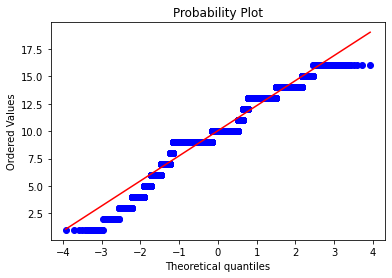

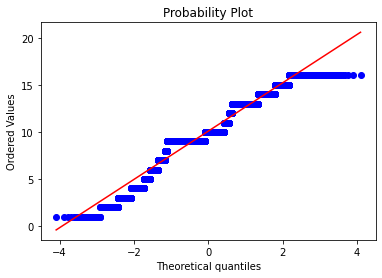

In [9]:
histogram(adult_incomes[adult_incomes["gender"] == "Female"]["educational-num"], 
          "Female education years", "Number of years", "rgb(188, 128, 189)")

normal_qqplot(adult_incomes[adult_incomes["gender"] == "Female"]["educational-num"])

histogram(adult_incomes[adult_incomes["gender"] == "Male"]["educational-num"], 
          "Male education years", "Number of years", "#3366CC")

normal_qqplot(adult_incomes[adult_incomes["gender"] == "Male"]["educational-num"])

As can be observed from the histograms above, the Histogram structure looks normal, therfore we assume our data ~ditributes normal.

<h4>c. T-Tests</h4>

In [10]:
se_male, se_female

(2.660680037384967, 2.3793724533089455)

In [11]:
stats.ttest_ind(adult_incomes[adult_incomes["gender"] == "Female"]["educational-num"], 
             adult_incomes[adult_incomes["gender"] == "Male"]["educational-num"],
             equal_var=True)

Ttest_indResult(statistic=-2.061560503499744, pvalue=0.03925487700887444)

In [12]:
ttests_e = stats.ttest_ind(adult_incomes[adult_incomes["gender"] == "Female"]["educational-num"], 
             adult_incomes[adult_incomes["gender"] == "Male"]["educational-num"],
             equal_var=True)

<h4>Conclusion</h4>
As can be seen above, the pValue resulted from the T-Test is 0.03, e.g. the smallest level of significance at which the null hypothesis would be rejected is 0.03. <br>
A smaller p-value means that there is stronger evidence in favor of the alternative hypothesis. <br>

For $\alpha\$ = 0.05 we will reject the null hypothesis.<br> 
Likewise, as we mentioned earlier in question 1.c, overlapping of confidence intervals doesn't has statistical significance.

<h4>d. Wald Test</h4>

In [13]:
# The statistic of T-Test and Wald Test are identical
W = abs(-2.061560503499744)

z = stats.norm.ppf(1 - alpha / 2)

Wald_p_val = 2 - 2 * stats.norm.cdf(W)

print(f"Wald Statistic: {W}")
print(f"Pvalue: {Wald_p_val}")

if W > z:
    print("Reject null hypothesis")
else:
    print("Accept null hypothesis")

Wald Statistic: 2.061560503499744
Pvalue: 0.039249597598945085
Reject null hypothesis


In both tests we have rejected the null hypothesis and we got ~same Pvalues, as expected.

<h4>e. Likelihood Ratio Tests</h4>  <br>

Let $X$ = number of female educational years <br>
Let $Y$ = number of male educational years <br>

Let $\mu_{1}$ be the expectation of number of female educational years <br>
and let $\mu_{2}$ be the expectation of number of male educational years. <br>

$H_{0}: \: \alpha = \mu_{1} - \mu_{2} = 0$ <br>
$H_{1}: \: \alpha = \mu_{1} - \mu_{2} \neq 0$ <br> <br>

Under $H_{0}$, MLE for $\mu_{1}$ is $\hat\mu_{1} = \bar X$  <br>
$\alpha = \mu_{1} - \mu_{2} = 0 \Rightarrow \mu_{2} = \mu_{1} - \alpha = \mu_{1} - 0 = \mu_{1}$ <br>
$\Rightarrow \hat\mu_{2} = \hat\mu_{1}$

<br>

In general, MLE for $\mu_{1}$ is $\hat\mu_{1} = \bar X$ and $\mu_{2}$ is $\hat\mu_{1} = \bar Y$  <br>
$\alpha = \mu_{1} - \mu_{2} \Rightarrow \hat\alpha = \bar X - \bar Y$ <br>

In [14]:
def normal_likelihood(values, mu, sigma, mu_0, sigma_0):
    """
    Computing the division in likelihood ratio test
    values: array-like object, contains element to be histogramed
    mu: float, expectation that maximize likelihood
    sigma: float, standard division that maximize likelihood
    mu_0: float, expectation that maximize likelihood under null hypothesis
    sigma_0: float, standard division that maximize likelihood under null hypothesis
    """
    l = 1
    for value in values:
        l *=  (stats.norm.pdf(value, loc=mu, scale=sigma) / stats.norm.pdf(value, loc=mu_0, scale=sigma_0))
    return l

In [15]:
lamda = 2 * math.log10(normal_likelihood(adult_incomes[adult_incomes["gender"] == "Male"]["educational-num"], 
                                         mean_male, se_male, mean_female, se_male))

quantile = stats.chi2.ppf(1 - (alpha / 2), 1)

if lamda > quantile:
    print("Reject H0")
else:
    print("Accept H0")

Reject H0


<h4>h. Bonus</h4>  <br>

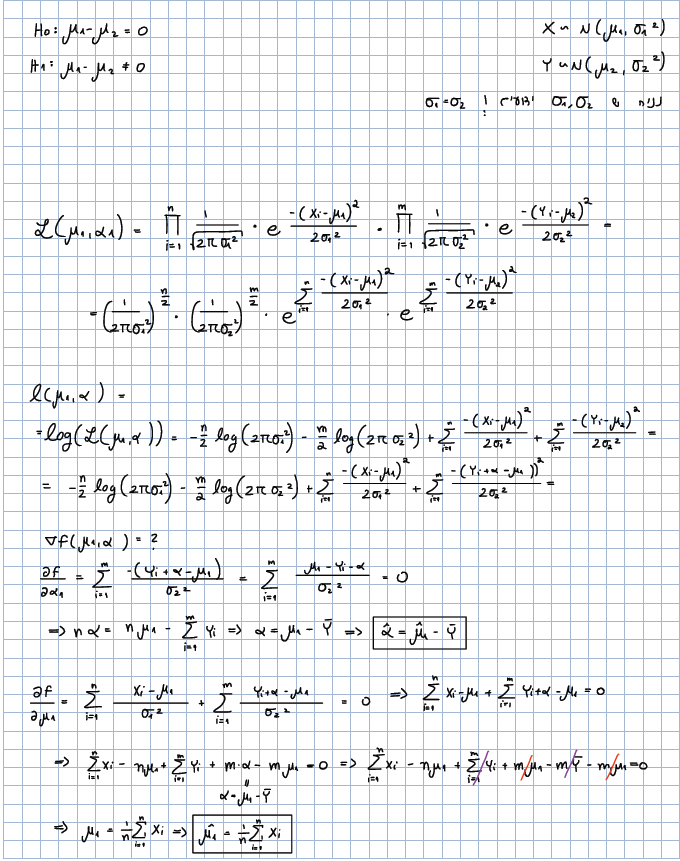

In [16]:
from IPython.display import Image
Image(filename='2h.png')

<h3>3. Different Data Set Sizes</h3>

<h4>a. Sample data</h4>  <br>

In [17]:
np.random.seed(126)

sizes = [30, 50, 100, 500]

sampled_data = [adult_incomes.sample(n=size) for size in sizes]

<h4>b. Confidence Interval for Sampled Data</h4>  <br>

In [18]:
for data in sampled_data:
    print(f"Confidence Interval for data with {len(data)} random records")
    s_mean_male, s_mean_female =\
    mean_feature_by_binary_value(data, numeric_feature, binary_feature, binary_values[0]),\
    mean_feature_by_binary_value(data, numeric_feature, binary_feature, binary_values[1])
    
    s_se_male, s_se_female =\
    var_feature_by_binary_value(data, numeric_feature, binary_feature, binary_values[0]) ** 0.5,\
    var_feature_by_binary_value(data, numeric_feature, binary_feature, binary_values[1]) ** 0.5

    s_male_confidence_interval = [s_mean_male - z_quantile * s_se_male, s_mean_male + z_quantile * s_se_male]
    s_female_confidence_interval = [s_mean_female - z_quantile * s_se_female, s_mean_female + z_quantile * s_se_female]
    
    print("Male Interval: ", s_male_confidence_interval, 
          f"length = {s_male_confidence_interval[1] - s_male_confidence_interval[0]}")
    print("Female Interval: ", s_female_confidence_interval, 
          f"length = {s_female_confidence_interval[1] - s_female_confidence_interval[0]}")
    print()

Confidence Interval for data with 30 random records
Male Interval:  [5.283905231533937, 15.616094768466063] length = 10.332189536932127
Female Interval:  [5.0292598796660535, 15.370740120333945] length = 10.341480240667892

Confidence Interval for data with 50 random records
Male Interval:  [6.0112051598099026, 15.015821867217126] length = 9.004616707407223
Female Interval:  [6.75267160243221, 13.862713012952407] length = 7.110041410520196

Confidence Interval for data with 100 random records
Male Interval:  [4.986660946039422, 15.787532602347675] length = 10.800871656308253
Female Interval:  [6.415456784012359, 13.742437952829746] length = 7.326981168817388

Confidence Interval for data with 500 random records
Male Interval:  [5.152565565023741, 15.224679943958295] length = 10.072114378934554
Female Interval:  [5.219702049566312, 14.81644252874694] length = 9.596740479180628



Main points & Conclusions
* The overall results from the different sample sizes are similar to the one on section 1.b.
    In addition, we can see that the confidence intervals converge to the intervals in section 1.b as the sample suze gets bigger.

<h4>c. Wald test for Sampled Data</h4>  <br>

In [19]:
for data in sampled_data:
    print(f"Wald Test for data with {len(data)} random records")
    statistic = abs(stats.ttest_ind(data[data["gender"] == "Female"]["educational-num"], 
             data[data["gender"] == "Male"]["educational-num"],
             equal_var=True).statistic)
    data_Wald_p_val = 2 - 2 * stats.norm.cdf(statistic)
    print(f"Statistic: {statistic}", f"Pvalue: {data_Wald_p_val}")
    if statistic > z:
        print("Reject null hypothesis")
    else:
        print("Accept null hypothesis")
    print()

Wald Test for data with 30 random records
Statistic: 0.23652023276386538 Pvalue: 0.8130290091209109
Accept null hypothesis

Wald Test for data with 50 random records
Statistic: 0.28668067186989193 Pvalue: 0.7743568382886423
Accept null hypothesis

Wald Test for data with 100 random records
Statistic: 0.6027443564133268 Pvalue: 0.5466787686220089
Accept null hypothesis

Wald Test for data with 500 random records
Statistic: 0.7084849377750014 Pvalue: 0.47864416257030706
Accept null hypothesis



Main points & Conclusions<br>
It can be seen that the results are different from section 2.d.
* The first observation is that the Pvalue decrease as the size of the sampled data size increase.
    This is expected, as we already had seen in the basic course of Statistics 1, that it's harder to reject the null hypothesis with small amount of samples.
    
* We can inferr from the decreasing tendency results that if we keep sampling bigger data sets we will converge to the result we saw on section 2.b.

<h4>d. Wald test for Sampled Data</h4>  <br>

In [20]:
sim_stats = {30:{"times_male_in_interval":0, "times_female_in_interval":0, 
                 "times_rejected":0, "statistic":[], "pVal":[]},
            50:{"times_male_in_interval":0, "times_female_in_interval":0, 
                "times_rejected":0, "statistic":[], "pVal":[]}, 
            100:{"times_male_in_interval":0, "times_female_in_interval":0, 
                 "times_rejected":0, "statistic":[], "pVal":[]}, 
            500:{"times_male_in_interval":0, "times_female_in_interval":0, 
                 "times_rejected":0, "statistic":[], "pVal":[]}}

for i in range(100):
    sampled_data = [adult_incomes.sample(n=size) for size in sizes]
    
    for data in sampled_data:
    
        s_mean_male, s_mean_female =\
        mean_feature_by_binary_value(data, numeric_feature, binary_feature, binary_values[0]),\
        mean_feature_by_binary_value(data, numeric_feature, binary_feature, binary_values[1])

        s_se_male, s_se_female =\
        var_feature_by_binary_value(data, numeric_feature, binary_feature, binary_values[0]) ** 0.5,\
        var_feature_by_binary_value(data, numeric_feature, binary_feature, binary_values[1]) ** 0.5

        s_male_confidence_interval = [s_mean_male - z_quantile * s_se_male, 
                                      s_mean_male + z_quantile * s_se_male]
        
        s_female_confidence_interval = [s_mean_female - z_quantile * s_se_female, 
                                        s_mean_female + z_quantile * s_se_female]
        
        if s_male_confidence_interval[0] <= mean_male <= s_male_confidence_interval[1]:
            sim_stats[len(data)]["times_male_in_interval"] += 1
            
        if s_female_confidence_interval[0] <= mean_female <= s_female_confidence_interval[1]:
            sim_stats[len(data)]["times_female_in_interval"] += 1
        

        statistic = abs(stats.ttest_ind(data[data["gender"] == "Female"]["educational-num"], 
                 data[data["gender"] == "Male"]["educational-num"],
                 equal_var=True).statistic)
        sim_stats[len(data)]["statistic"].append(statistic)
        
        
        data_Wald_p_val = 2 - 2 * stats.norm.cdf(statistic)
        sim_stats[len(data)]["pVal"].append(data_Wald_p_val)
        
        if statistic > z:
            sim_stats[len(data)]["times_rejected"] += 1

In [21]:
for data_size, size_statistics in sim_stats.items():
    print(f"Statistics for data size: {data_size}")
    print("Null Hypothesis rejection rate:", size_statistics["times_rejected"] / 100)
    print("Male mean inside interval rate:", size_statistics["times_male_in_interval"] / 100)
    print("Feale mean inside interval rate:", size_statistics["times_female_in_interval"] / 100)
    
    colors = ['#2BCDC1', '#F66095']

    # statistic distribution
    x = np.random.chisquare(1, 10000)
    y = size_statistics["statistic"]
    hist_data = [x, y]
    group_labels = ['chisquare', "Wald Statistic"] # name of the dataset
    fig = ff.create_distplot(hist_data, group_labels, show_hist=False, colors=colors)
    fig.update(layout_title_text='Wald Test Statistic distribution VS chisquare_1 distribution')
    fig.show()
    
    #
    x = np.random.uniform(size=10000)
    y = size_statistics["pVal"]
    hist_data = [x, y]
    group_labels = ['uniform', "Pval"] # name of the dataset
    fig = ff.create_distplot(hist_data, group_labels, show_hist=False, colors=colors)
    fig.update(layout_title_text='Pval distribution VS uniform(0, 1) distribution')
    fig.show()

Statistics for data size: 30
Null Hypothesis rejection rate: 0.06
Male mean inside interval rate: 1.0
Feale mean inside interval rate: 1.0


Statistics for data size: 50
Null Hypothesis rejection rate: 0.03
Male mean inside interval rate: 1.0
Feale mean inside interval rate: 1.0


Statistics for data size: 100
Null Hypothesis rejection rate: 0.05
Male mean inside interval rate: 1.0
Feale mean inside interval rate: 1.0


Statistics for data size: 500
Null Hypothesis rejection rate: 0.05
Male mean inside interval rate: 1.0
Feale mean inside interval rate: 1.0


Main points & Conclusions <br>
We can see that as sample size increase we have better matching of the empirical results to theoretical distributions:
* As we saw in class, the Likelihood ratio test Statistic distributes as chisquare
* As we have prooved at home, the Likelihood ratio test distributes as chisquare